# FAOStat Dataset: Time Series

## Business Understanding 

### Overview

Kenya's food production plays a crucial role in ensuring food security for its population. The country's agricultural sector employs a significant portion of the population and contributes to the national economy. Kenya is known for its diverse agricultural activities, including crop cultivation, livestock rearing, and fisheries.
In recent years, Kenya has made strides to improve food production through various initiatives, including promoting modern farming techniques, investing in irrigation infrastructure, and supporting small-scale farmers. These efforts have led to increased agricultural productivity and improved crop yields.
However, despite these advancements, food production in Kenya still faces challenges that affect its sufficiency. Climate change, unpredictable weather patterns, and recurrent droughts pose significant risks to agricultural productivity. Additionally, limited access to affordable inputs, inadequate infrastructure, and post-harvest losses contribute to the food production challenges.
As a result, Kenya occasionally experiences food shortages and relies on imports to meet the country's food demands. Despite efforts to enhance domestic food production, there is a need for further investment in sustainable agriculture, resilient farming practices, and improved market access to ensure long-term food sufficiency in Kenya.
Overall, while Kenya has made progress in food production, there is still work to be done to achieve full sufficiency. Continued efforts to address challenges and invest in sustainable agricultural practices are essential to enhance food security and meet the growing demands of the population.

### Problem Statement

The current state of food production in Kenya poses challenges to ensuring sufficient food supply for the growing population. Despite efforts to improve agricultural productivity, factors such as climate change, unpredictable weather patterns, and limited access to resources continue to impact the ability to accurately forecast and meet the population's food needs.

There is a need for a reliable prediction model that can forecast food production in Kenya to assess whether it will be sufficient to meet the population's requirements. Such a model would help policymakers, agricultural stakeholders, and government agencies make informed decisions regarding food security, resource allocation, and import/export planning.

By leveraging historical data, real-time information, and advanced analytical techniques, the model would provide valuable insights into future food production levels, helping to identify potential shortfalls or surpluses.

The development of a prediction model would support proactive planning and decision-making processes, allowing stakeholders to take appropriate measures in advance to bridge any potential food supply gaps. It would aid in optimizing resource allocation, promoting sustainable farming practices, and implementing targeted interventions to ensure food sufficiency for Kenya's population.

Therefore, the problem at hand is the lack of a reliable prediction model that accurately forecasts food production, which hinders the ability to determine whether it will be sufficient to meet the growing population's needs. Developing such a model would greatly contribute to enhancing food security, optimizing resource allocation, and ensuring the well-being of the Kenyan population.

### Objectives

The objectives of the prediction model for food production in Kenya are as follows:

1. Forecasting Food Production: The primary objective of the model is to accurately predict food production levels in Kenya. By analyzing historical data, current conditions, and relevant variables, the model aims to provide forecasts that reflect the expected output of crops, livestock, and other food sources.

2. Assessing Food Sufficiency: The model seeks to determine whether the projected food production will be sufficient to meet the needs of the population. It aims to assess the adequacy of food supply in order to identify potential shortfalls or surpluses.

3. Informing Decision-Making: The model aims to provide valuable insights to policymakers, government agencies, and agricultural stakeholders. By offering reliable predictions, the model can inform decision-making processes related to resource allocation, import/export planning, and interventions to ensure food security.

4. Optimizing Resource Allocation: The model aims to optimize the allocation of resources by identifying areas of potential food shortages or surpluses. This can help in directing resources, such as irrigation, fertilizers, and agricultural investments, to areas that require them the most.

5. Promoting Sustainable Farming Practices: By considering various factors that impact food production, such as climate conditions and agricultural practices, the model can promote sustainable farming techniques. It can provide recommendations for resilient and environmentally-friendly practices that enhance productivity while minimizing negative impacts.

6. Enhancing Food Security: Ultimately, the objective of the prediction model is to contribute to improving food security in Kenya. By accurately forecasting food production and assessing sufficiency, the model aims to support proactive measures that ensure a consistent and adequate food supply for the growing population.

These objectives collectively aim to provide valuable insights, aid decision-making processes, and contribute to long-term food security in Kenya.

## Data Understanding

The data from this project comes from the FAOStas site.
[Food Balances](https://www.fao.org/faostat/en/#data/SCL)

The CSV has the following columns:

1. Area Code (M49): This column represents the standard area codes used by the United Nations for statistical purposes. The codes are developed and maintained by the United Nations Statistics Division.

2. Area: This column contains the country name or area name corresponding to the data.

3. Element Code: The element code represents the entities or categories based on which the data is collected. It is a numerical code used to identify specific elements.

4. Element: This column provides a description or name for the entities or categories represented by the element code.

5. Item Code (CPC): The item code refers to the Central Product Classification code assigned to a specific product or item. It is a standardized code used for classification purposes.

6. Item: This column contains the product or item classification name. It is based on the Central Product Classification (CPC) system promulgated by the United Nations Statistical Commission.

7. Year: This column represents the year when the data was collected or recorded.

8. Unit: The unit column specifies the measurement unit used for the corresponding item. It indicates the quantity or scale in which the data is measured (e.g., kilograms, tonnes, liters).

9. Value: This column provides the numerical value associated with a specific item, measured in the units specified in the "Unit" column. It represents the quantity or magnitude of the item for a given year and area.

10. Flag: The flag column describes how the values in the dataset were acquired by the FAO (Food and Agriculture Organization of the United Nations). The flag values indicate the data's source or quality.

11. Flag Description: This column provides additional information or descriptions related to the flags used in the dataset. The "E" flag represents estimated values, the "X" flag indicates figures from international organizations, and the "I" flag denotes imputed values.

In summary, the dataset contains food balance data from different countries or areas, including information about the area, element, item, year, measurement unit, value, and data quality flags. The dataset helps in understanding food consumption, production, and other related factors for various products and regions over time.

## Data Preparation

In [186]:
#importing necessary libraries
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")
 

import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib.pylab import rcParams
from statsmodels.tsa.stattools import adfuller
from matplotlib.dates import AutoDateLocator, ConciseDateFormatter 
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARMA
# import pmdarima as pm
# from pmdarima.arima import auto_arima
# from pmdarima import model_selection
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf

In [187]:
#previewing the dataset
faoDf = pd.read_csv('FaoStat_EA.csv')
faoDf.head(10)

,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Year,Unit,Value,Flag,Flag Description
0,108,Burundi,511,Total Population - Both sexes,F2501,Population,2014,1000 No,9844.30,X,Figure from international organizations
1,108,Burundi,511,Total Population - Both sexes,F2501,Population,2015,1000 No,10160.03,X,Figure from international organizations
2,108,Burundi,511,Total Population - Both sexes,F2501,Population,2016,1000 No,10488.00,X,Figure from international organizations
3,108,Burundi,511,Total Population - Both sexes,F2501,Population,2017,1000 No,10827.02,X,Figure from international organizations
4,108,Burundi,511,Total Population - Both sexes,F2501,Population,2018,1000 No,11175.37,X,Figure from international organizations
5,108,Burundi,511,Total Population - Both sexes,F2501,Population,2019,1000 No,11530.58,X,Figure from international organizations
6,108,Burundi,511,Total Population - Both sexes,F2501,Population,2020,1000 No,11890.78,X,Figure from international organizations
7,108,Burundi,5301,Domestic supply quantity,F2501,Population,2014,1000 t,0.00,I,Imputed value
8,108,Burundi,5301,Domestic supply quantity,F2501,Population,2015,1000 t,0.00,I,Imputed value
9,108,Burundi,5301,Domestic supply quantity,F2501,Population,2016,1000 t,0.00,I,Imputed value


In [188]:
class DataUnderstanding:
    def __init__(self, df):
        self.df = df
    
    def get_summary_statistics(self):
        summary_stats = self.df.describe()
        return summary_stats
    
    def get_missing_values(self):
        missing_values = self.df.isnull().sum()
        return missing_values
    
    def get_info(self):
        info = self.df.info()
        return info
    
    def get_dtypes(self):
        dtypes = self.df.dtypes
        return dtypes
    
    def get_value_counts(self):
        value_counts = {}
        for column in self.df.columns:
            value_counts[column] = self.df[column].value_counts()
        return value_counts
    
    def convert_to_datetime(self, column):
        self.df[column] = pd.to_datetime(self.df[column])
    
    def set_index(self, column):
        self.df.set_index(column, inplace=True)
    
    def sort_data(self):
        self.df.sort_index(inplace=True)


In [189]:
# Initialize the DataUnderstanding class with your DataFrame 'df'
du = DataUnderstanding(df)

In [190]:
# Get the summary statistics
summary_stats = du.get_summary_statistics()
print("Summary Statistics:")
summary_stats

Summary Statistics:


,Area Code (M49),Element Code,Year,Value
count,38257.000000,38257.000000,38257.000000,38257.000000
mean,537.488251,4700.796926,2015.273257,209.897015
std,270.925205,1734.143947,3.168741,2217.437940
min,108.000000,511.000000,2010.000000,-201.000000
25%,180.000000,5142.000000,2013.000000,0.000000
50%,646.000000,5301.000000,2015.000000,0.200000
75%,800.000000,5611.000000,2018.000000,15.000000
max,834.000000,5911.000000,2020.000000,89561.400000


In [191]:
# Get the information about the DataFrame
info = du.get_info()
print("\nDataFrame Information:")
print(info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38257 entries, 0 to 38256
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Area Code (M49)   38257 non-null  int64  
 1   Area              38257 non-null  object 
 2   Element Code      38257 non-null  int64  
 3   Element           38257 non-null  object 
 4   Item Code (CPC)   38257 non-null  object 
 5   Item              38257 non-null  object 
 6   Year              38257 non-null  int64  
 7   Unit              38257 non-null  object 
 8   Value             38257 non-null  float64
 9   Flag              38257 non-null  object 
 10  Flag Description  38257 non-null  object 
dtypes: float64(1), int64(3), object(7)
memory usage: 3.2+ MB

DataFrame Information:
None


In [192]:
# Get the data types
dtypes = du.get_dtypes()
print("\nData Types:")
print(dtypes)



Data Types:
Area Code (M49)       int64
Area                 object
Element Code          int64
Element              object
Item Code (CPC)      object
Item                 object
Year                  int64
Unit                 object
Value               float64
Flag                 object
Flag Description     object
dtype: object


In [193]:
# Get the count of unique values for each column
value_counts = du.get_value_counts()
print("\nValue Counts:")
print(value_counts)


Value Counts:
{'Area Code (M49)': 834    7020
404    6962
800    6800
646    6508
180    6248
108    3724
728     995
Name: Area Code (M49), dtype: int64, 'Area': United Republic of Tanzania         7020
Kenya                               6962
Uganda                              6800
Rwanda                              6508
Democratic Republic of the Congo    6248
Burundi                             3724
South Sudan                          995
Name: Area, dtype: int64, 'Element Code': 5301    6165
5611    5862
5142    5773
645     5745
5170    5402
5911    4900
5511    4346
511       64
Name: Element Code, dtype: int64, 'Element': Domestic supply quantity               6165
Import Quantity                        5862
Food                                   5773
Food supply quantity (kg/capita/yr)    5745
Residuals                              5402
Export Quantity                        4900
Production                             4346
Total Population - Both sexes            64
Name: 

In [194]:
# Get the count of missing values
missing_values = du.get_missing_values()
print("\nMissing Values:")
print(missing_values)


Missing Values:
Area Code (M49)     0
Area                0
Element Code        0
Element             0
Item Code (CPC)     0
Item                0
Year                0
Unit                0
Value               0
Flag                0
Flag Description    0
dtype: int64


In [195]:
df = faoDf.copy()

# Pivot the dataframe
pivot_df = df.pivot(index=['Area Code (M49)', 'Area', 'Element Code', 'Element', 'Item Code (CPC)', 'Item', 'Unit', 'Flag',
                          'Flag Description'],
                    columns='Year',
                    values='Value').reset_index()

In [196]:
pivot_df

Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,108,Burundi,511,Total Population - Both sexes,F2501,Population,1000 No,X,Figure from international organizations,NaN,NaN,NaN,NaN,9844.30,10160.03,10488.00,10827.02,11175.37,11530.58,11890.78
1,108,Burundi,645,Food supply quantity (kg/capita/yr),F2511,Wheat and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,4.74,2.48,5.26,6.41,7.02,7.63,5.63
2,108,Burundi,645,Food supply quantity (kg/capita/yr),F2513,Barley and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,108,Burundi,645,Food supply quantity (kg/capita/yr),F2514,Maize and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,13.57,16.08,23.66,23.67,28.49,23.92,21.54
4,108,Burundi,645,Food supply quantity (kg/capita/yr),F2515,Rye and products,kg,E,Estimated value,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4479,834,United Republic of Tanzania,5911,Export Quantity,F2782,"Fish, Liver Oil",1000 t,E,Estimated value,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
4480,834,United Republic of Tanzania,5911,Export Quantity,F2782,"Fish, Liver Oil",1000 t,I,Imputed value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,NaN
4481,834,United Republic of Tanzania,5911,Export Quantity,F2807,Rice and products,1000 t,I,Imputed value,75.0,54.0,27.0,79.0,107.00,23.00,19.00,1.00,46.00,171.00,527.00
4482,834,United Republic of Tanzania,5911,Export Quantity,F2848,Milk - Excluding Butter,1000 t,I,Imputed value,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00


#### pandas profiling Report

In [197]:
# pip install pandas-profiling

report = pandas_profiling.ProfileReport(pivot_df)

In [198]:
report.to_notebook_iframe()

In [199]:
# html
report.to_file("report.html")

### Data Cleaning

In [200]:
#Checking for duplicates and missing data
def cleaning(pivot_df):
    "This is a simple function to get missing and duplicated values"
    missing = pivot_df.isna().sum().sum()
    duplicated = pivot_df.duplicated().sum()
    return (f"There are '{missing}' missing values and '{duplicated}' duplicated values in the dataset")

In [201]:
cleaning(pivot_df)

"There are '11067' missing values and '0' duplicated values in the dataset"

In [202]:
# A function checking the percentage of the missing values
def missing_values_percentage(pivot_df):
    total_missing = pivot_df.isnull().sum().sum()
    total_cells = pivot_df.size
    percentage_missing = (total_missing / total_cells) * 100
    return percentage_missing

missing_values_percentage(pivot_df)

12.340544157002677

In [203]:
# filling the missing values with 0
pivot_filled = pivot_df.fillna(0)

In [204]:
cleaning(pivot_filled)

"There are '0' missing values and '0' duplicated values in the dataset"

#### Dealing with missing values
When dealing with missing values in a food balance sheet dataset, filling them with zeros can be a reasonable approach depending on 

1.Nature of the missing values: Food balance sheet datasets typically contain information about various food items, quantities, and production/consumption values. Missing values in the  datasets  arise due to different reasons, such as data collection limitations, reporting gaps, or incomplete records.

2.In our  case, missing values indicate that no data is available for a specific item or category.Considering countries like South Sudan  there was no data in the earlier years as it was just incorporated as a country of late 2019.

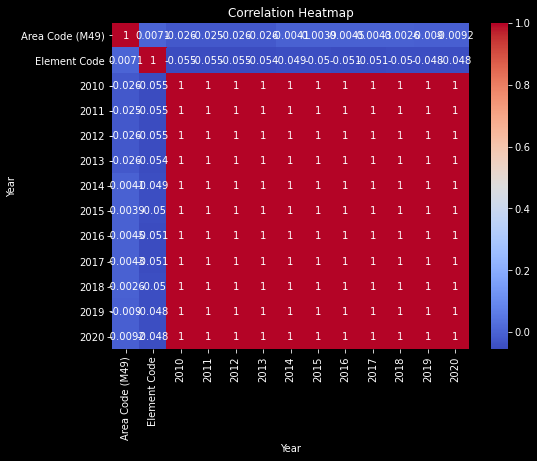

In [219]:
# Correlations
correlation_matrix = pivot_df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(data=correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

## EDA and VISUALIZATION

###  Univariate Analysis

Through this univariate analysis, we aim to identify the top 10 food products in East African countries based on production, consumption, or trade quantities. The analysis will provide valuable insights into the food landscape of the region , researchers, and us make informed decisions. The findings may contribute to understanding the food preferences, agricultural practices, and trade dynamics within East African countries

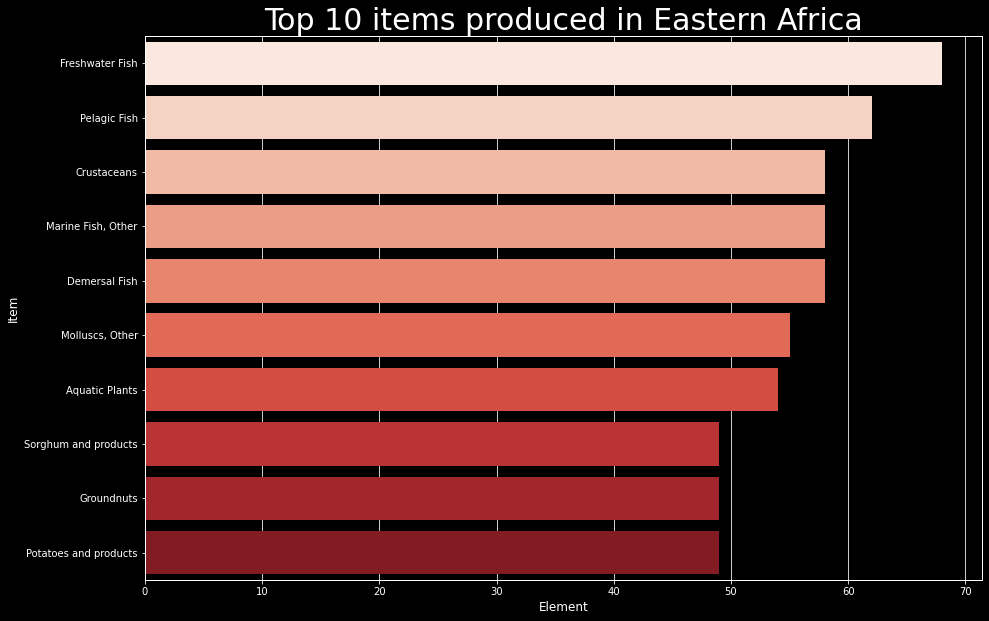

In [236]:
# setting the style to be ggplot
plt.style.use("dark_background")

items = pd.DataFrame(pivot_df.groupby("Item")["Element"].agg("count").sort_values(ascending=False))[:10]

# plotting
plt.rcParams['figure.figsize'] = (15, 10)
#plt.gcf().subplots_adjust(left = .3)
sns.barplot(x = items.Element, y = items.index, data = items, palette = 'Reds')
plt.gca().set_title("Top 10 items produced in Eastern Africa", fontsize = 30)
plt.show()

After analyzing a visualization of the top 10 items produced by East African countries, we can observe distinct production patterns. Freshwater fish emerges as the dominant product, closely followed by pelagic fish. Conversely, potatoes and associated products exhibit the lowest production levels among the selected items.

In [206]:
pivot_df.Area.value_counts()

United Republic of Tanzania         699
Kenya                               693
Uganda                              676
Rwanda                              652
Democratic Republic of the Congo    648
Burundi                             575
South Sudan                         541
Name: Area, dtype: int64

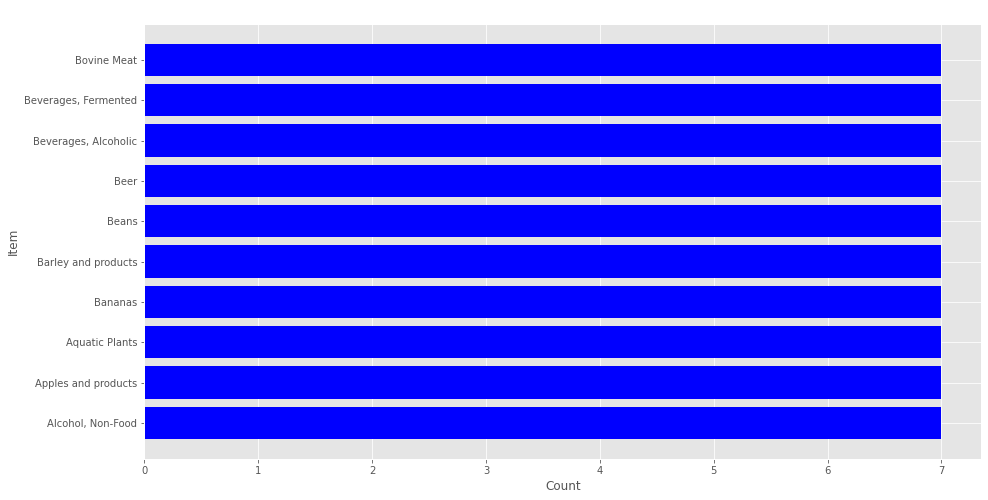

In [235]:
# # setting the style to be ggplot
# plt.style.use("ggplot")

# # Get the top products based on domestic supply quantity
# items = pd.DataFrame(pivot_df[pivot_df['Element'] == 'Domestic supply quantity'].groupby('Item')['Item'].count().nlargest(10))
# items.columns = ['Count']

# # Plot the bar graph
# plt.rcParams['figure.figsize'] = (15, 8)
# plt.barh(items.index, items['Count'], color='blue')
# plt.xlabel('Count')
# plt.ylabel('Item')
# plt.title('Top Products in Domestic Supply Quantity')
# plt.show()

### Bivariate Analysis

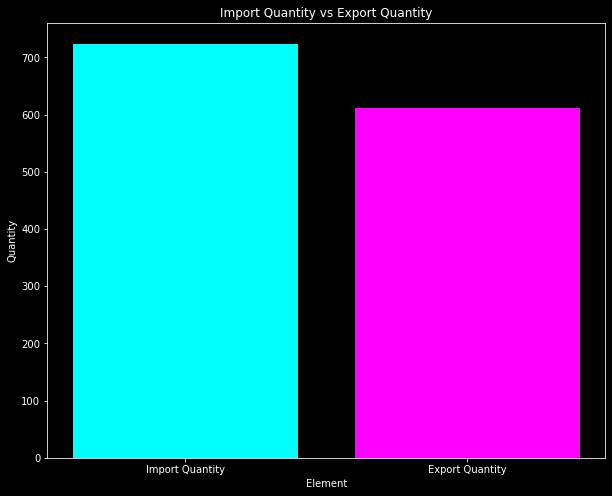

In [207]:
# Extract the 'Import Quantity' and 'Export Quantity' values from the pivot_df DataFrame
import_quantity = len(pivot_df[pivot_df['Element'] == 'Import Quantity'])
export_quantity = len(pivot_df[pivot_df['Element'] == 'Export Quantity'])

# Create a bar graph
labels = ['Import Quantity', 'Export Quantity']
sizes = [import_quantity, export_quantity]
colors = ['cyan', 'magenta']

plt.rcParams['figure.figsize'] = (10, 8)
plt.bar(labels, sizes, color=colors)
plt.xlabel('Element')
plt.ylabel('Quantity')
plt.title('Import Quantity vs Export Quantity')
plt.show()


The bar graph represents the comparison between the import quantity and export quantity in the dataset. The x-axis shows the two elements: "Import Quantity" and "Export Quantity." The y-axis represents the corresponding quantities.

The bars in the graph depict the quantities, with the cyan color indicating the import quantity and the magenta color indicating the export quantity.

This graph provides a visual representation of the difference between the import and export quantities, allowing for easy comparison between the two elements.

### Multivariate Analysis

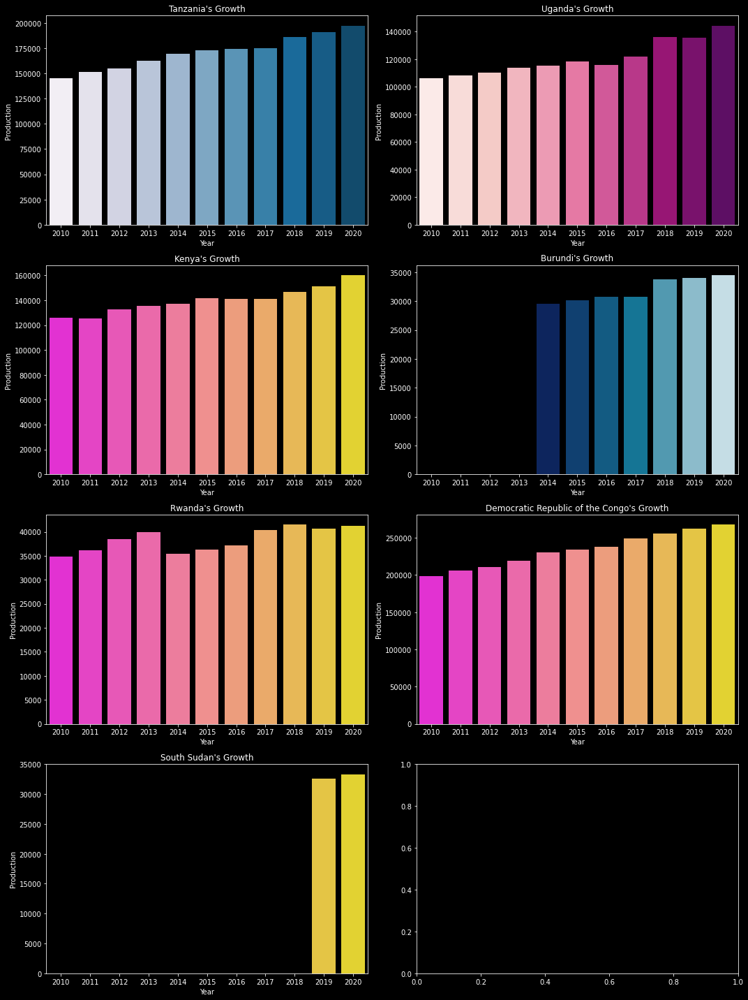

In [208]:
# Create subplots with a 4x2 grid
fig, axes = plt.subplots(4, 2, figsize=(15, 20))

# Plot 1: Tanzania's Growth
tanzania_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'United Republic of Tanzania'].loc[:, "2010":"2020"].agg("sum", axis=0))
tanzania_production.columns = ['Production']
sns.barplot(x=tanzania_production.index, y=tanzania_production['Production'], data=tanzania_production, palette='PuBu', ax=axes[0, 0])
axes[0, 0].set_title("Tanzania's Growth")

# Plot 2: Uganda's Growth
uganda_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Uganda'].loc[:, "2010":"2020"].agg("sum", axis=0))
uganda_production.columns = ['Production']
sns.barplot(x=uganda_production.index, y=uganda_production['Production'], data=uganda_production, palette='RdPu', ax=axes[0, 1])
axes[0, 1].set_title("Uganda's Growth")

# Plot 3: Kenya's Growth
kenya_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Kenya'].loc[:, "2010":"2020"].agg("sum", axis=0))
kenya_production.columns = ['Production']
sns.barplot(x=kenya_production.index, y=kenya_production['Production'], data=kenya_production, palette='spring', ax=axes[1, 0])
axes[1, 0].set_title("Kenya's Growth")

# Plot 4: Burundi's Growth
burundi_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Burundi'].loc[:, "2010":"2020"].agg("sum", axis=0))
burundi_production.columns = ['Production']
sns.barplot(x=burundi_production.index, y=burundi_production['Production'], data=burundi_production, palette='ocean', ax=axes[1, 1])
axes[1, 1].set_title("Burundi's Growth")

# Plot 5: Rwanda's Growth
rwanda_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Rwanda'].loc[:, "2010":"2020"].agg("sum", axis=0))
rwanda_production.columns = ['Production']
sns.barplot(x=rwanda_production.index, y=rwanda_production['Production'], data=rwanda_production, palette='spring', ax=axes[2, 0])
axes[2, 0].set_title("Rwanda's Growth")

# Plot 6: Democratic Republic of the Congo's Growth
drc_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'Democratic Republic of the Congo'].loc[:, "2010":"2020"].agg("sum", axis=0))
drc_production.columns = ['Production']
sns.barplot(x=drc_production.index, y=drc_production['Production'], data=drc_production, palette='spring', ax=axes[2, 1])
axes[2, 1].set_title("Democratic Republic of the Congo's Growth")

# Plot 7: South Sudan's Growth
south_sudan_production = pd.DataFrame(pivot_df[pivot_df['Area'] == 'South Sudan'].loc[:, "2010":"2020"].agg("sum", axis=0))
south_sudan_production.columns = ['Production']
sns.barplot(x=south_sudan_production.index, y=south_sudan_production['Production'], data=south_sudan_production, palette='spring', ax=axes[3, 0])
axes[3, 0].set_title("South Sudan's Growth")

# Adjust spacing between subplots
fig.tight_layout()

# Display the plot
plt.show()


Tanzania's Growth: Tanzania shows a steady increase in agricultural production from 2010 to 2020. The highest production levels are observed in 2017 and 2018.

Uganda's Growth: Uganda exhibits a fluctuating pattern in agricultural production over the years. The highest production levels are observed in 2012 and 2019.

Kenya's Growth: Kenya demonstrates a generally increasing trend in agricultural production with a significant rise in production from 2014 to 2015. The highest production levels are observed in 2015 and 2019.

Burundi's Growth: Burundi shows a relatively stable level of agricultural production with minor fluctuations over the years. The highest production levels are observed in 2013 and 2019.

Rwanda's Growth: Rwanda experiences a notable increase in agricultural production from 2010 to 2013, followed by a relatively small decline in production. The highest production levels are observed in 2015 and 2017.

Democratic Republic of the Congo's Growth: The Democratic Republic of the Congo exhibits a fluctuating pattern in agricultural production, with significant variations from year to year. The highest production levels are observed in 2011 and 2018.

South Sudan's Growth: South Sudan shows a fluctuating pattern in agricultural production with a general increasing trend. The highest production levels are observed in 2015 and 2020.

Overall, the plots provide an overview of the growth patterns in agricultural production for these countries over the specified time period. They highlight the variations and trends in production levels, allowing for a comparison between the different countries.



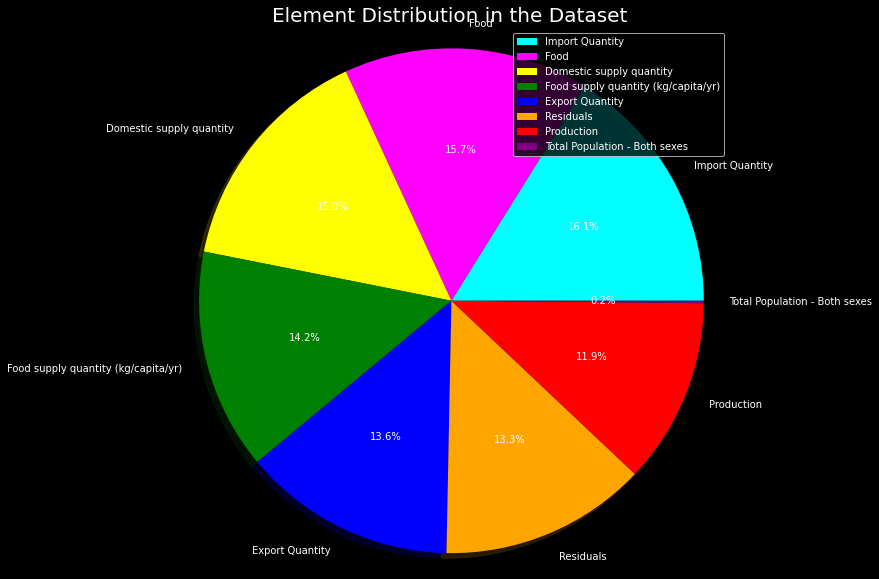

In [220]:
element_counts = pivot_df['Element'].value_counts()

# Set the labels and sizes for the pie chart
labels = element_counts.index
sizes = element_counts.values

# Set the colors for the pie chart
colors = ['cyan', 'magenta', 'yellow', 'green', 'blue', 'orange', 'red', 'purple']

# Plot the pie chart
plt.figure(figsize=(10, 10))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True)
plt.axis('equal')  # Equal aspect ratio ensures a circular pie
plt.axis('equal')  # Equal aspect ratio ensures a circular pie chart
plt.title('Element Distribution in the Dataset', fontsize=20)
plt.legend()
plt.show()

The pie chart reveals interesting insights about the distribution of elements in the dataset. "Import Quantity" emerges as the dominant element, accounting for the highest percentage of 16.1%. Following closely is the element "Food" with a significant portion of 15.7%. On the other hand, the element "Total Population" represents the smallest fraction, comprising only 0.2% of the dataset. These findings highlight the prominence of "Import Quantity" and "Food" in the dataset, underscoring their importance compared to the relatively minor role played by "Total Population".

## PREPROCESSING

We changed our data from wide range to long format for easier analysis

In [221]:
# Filter the dataframe
filtered_df = pivot_filled[(pivot_filled['Element'].str.contains('Domestic supply quantity'))
                 & (pivot_filled['Item'] != 'Population')]

# Print the filtered dataframe
filtered_df

Year,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
266,108,Burundi,5301,Domestic supply quantity,F2511,Wheat and products,1000 t,I,Imputed value,0.00,0.00,0.00,0.00,54.00,30.0,65.00,81.0,92.0,100.0,79.0
267,108,Burundi,5301,Domestic supply quantity,F2513,Barley and products,1000 t,I,Imputed value,0.00,0.00,0.00,0.00,14.00,14.0,15.00,16.0,17.0,18.0,17.0
268,108,Burundi,5301,Domestic supply quantity,F2514,Maize and products,1000 t,I,Imputed value,0.00,0.00,0.00,0.00,145.00,178.0,270.00,279.0,347.0,304.0,282.0
269,108,Burundi,5301,Domestic supply quantity,F2515,Rye and products,1000 t,I,Imputed value,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
270,108,Burundi,5301,Domestic supply quantity,F2516,Oats,1000 t,I,Imputed value,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4160,834,United Republic of Tanzania,5301,Domestic supply quantity,F2781,"Fish, Body Oil",1000 t,I,Imputed value,0.01,0.05,0.02,0.02,0.01,0.0,0.01,0.0,0.0,0.0,0.0
4161,834,United Republic of Tanzania,5301,Domestic supply quantity,F2782,"Fish, Liver Oil",1000 t,I,Imputed value,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0
4162,834,United Republic of Tanzania,5301,Domestic supply quantity,F2807,Rice and products,1000 t,I,Imputed value,1509.00,1576.00,1642.00,1758.00,1761.00,1878.0,2001.00,2109.0,2544.0,2396.0,2780.0
4163,834,United Republic of Tanzania,5301,Domestic supply quantity,F2848,Milk - Excluding Butter,1000 t,I,Imputed value,1821.00,1912.00,2029.00,2100.00,2199.00,2272.0,2348.00,2302.0,2616.0,2894.0,3226.0


The original dataset has 666 rows and 20 columns which makes it challenging to do any data analysis and visualization. We'll melt the dataframe so that the years are in one column and have the values in one column.

In [222]:
# Melting data 
def melt_data(df):
    melted = pd.melt(df, id_vars=['Area Code (M49)', 'Area', 'Element Code', 'Element', 'Item Code (CPC)', 'Item', 'Unit', 'Flag', 'Flag Description'], 
                     value_vars=df.columns[10:], var_name='Year', value_name='Value')
    return melted

# Apply the function to your dataframe
melted_df = melt_data(filtered_df)

In [223]:
melted_df

,Area Code (M49),Area,Element Code,Element,Item Code (CPC),Item,Unit,Flag,Flag Description,Year,Value
0,108,Burundi,5301,Domestic supply quantity,F2511,Wheat and products,1000 t,I,Imputed value,2011,0.0
1,108,Burundi,5301,Domestic supply quantity,F2513,Barley and products,1000 t,I,Imputed value,2011,0.0
2,108,Burundi,5301,Domestic supply quantity,F2514,Maize and products,1000 t,I,Imputed value,2011,0.0
3,108,Burundi,5301,Domestic supply quantity,F2515,Rye and products,1000 t,I,Imputed value,2011,0.0
4,108,Burundi,5301,Domestic supply quantity,F2516,Oats,1000 t,I,Imputed value,2011,0.0
...,...,...,...,...,...,...,...,...,...,...,...
6655,834,United Republic of Tanzania,5301,Domestic supply quantity,F2781,"Fish, Body Oil",1000 t,I,Imputed value,2020,0.0
6656,834,United Republic of Tanzania,5301,Domestic supply quantity,F2782,"Fish, Liver Oil",1000 t,I,Imputed value,2020,0.0
6657,834,United Republic of Tanzania,5301,Domestic supply quantity,F2807,Rice and products,1000 t,I,Imputed value,2020,2780.0
6658,834,United Republic of Tanzania,5301,Domestic supply quantity,F2848,Milk - Excluding Butter,1000 t,I,Imputed value,2020,3226.0
